In [ ]:
from google.colab import files
uploaded = files.upload()
print(uploaded)

TypeError: 'NoneType' object is not subscriptable

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import plotly.express as px
import warnings
warnings.filterwarnings(action = "ignore")

In [ ]:
data = pd.read_csv("/content/Amazon Sale Report.csv")

In [ ]:
data.shape

(128976, 19)

In [ ]:
data.head(2)


,index,Order ID,Date,Status,Fulfilment,Sales Channel,ship-service-level,Category,Size,Courier Status,Qty,currency,Amount,ship-city,ship-state,ship-postal-code,ship-country,B2B,fulfilled-by
0,0,405-8078784-5731545,4/30/2022,Cancelled,Merchant,Amazon.in,Standard,T-shirt,S,On the Way,0,INR,647.62,MUMBAI,MAHARASHTRA,400081,IN,False,Easy Ship
1,1,171-9198151-1101146,4/30/2022,Shipped - Delivered to Buyer,Merchant,Amazon.in,Standard,Shirt,3XL,Shipped,1,INR,406.00,BENGALURU,KARNATAKA,560085,IN,False,Easy Ship


In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 128976 entries, 0 to 128975
Data columns (total 19 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   index               128976 non-null  int64  
 1   Order ID            128976 non-null  object 
 2   Date                128976 non-null  object 
 3   Status              128976 non-null  object 
 4   Fulfilment          128976 non-null  object 
 5   Sales Channel       128976 non-null  object 
 6   ship-service-level  128976 non-null  object 
 7   Category            128976 non-null  object 
 8   Size                128976 non-null  object 
 9   Courier Status      128976 non-null  object 
 10  Qty                 128976 non-null  int64  
 11  currency            128976 non-null  object 
 12  Amount              128976 non-null  float64
 13  ship-city           128976 non-null  object 
 14  ship-state          128976 non-null  object 
 15  ship-postal-code    128976 non-nul

In [ ]:
data['Date'] = pd.to_datetime(data['Date'], errors='coerce')

In [ ]:
data.isnull().sum()


,0
index,0
Order ID,0
Date,0
Status,0
Fulfilment,0
Sales Channel,0
ship-service-level,0
Category,0
Size,0
Courier Status,0


In [ ]:
data['Amount'].fillna(data['Amount'].mean(), inplace = True)
data['ship-postal-code'].fillna(data['ship-postal-code'].mean(), inplace = True)


data['currency'].fillna(data['currency'].mode()[0], inplace = True)
data['fulfilled-by'].fillna(data['fulfilled-by'].mode()[0], inplace = True)
data['ship-state'].fillna(data['ship-state'].mode()[0], inplace = True)
data['ship-country'].fillna(data['ship-country'].mode()[0], inplace = True)
data['ship-city'].fillna(data['ship-city'].mode()[0], inplace = True)

NameError: name 'data' is not defined

In [ ]:
data.duplicated().sum()

np.int64(166)

In [ ]:
data.drop_duplicates(inplace = True)

In [ ]:
data.columns

Index(['index', 'Order ID', 'Date', 'Status', 'Fulfilment', 'Sales Channel',
       'ship-service-level', 'Category', 'Size', 'Courier Status', 'Qty',
       'currency', 'Amount', 'ship-city', 'ship-state', 'ship-postal-code',
       'ship-country', 'B2B', 'fulfilled-by'],
      dtype='object')

**EXPLORATORY DATA ANALYSIS**


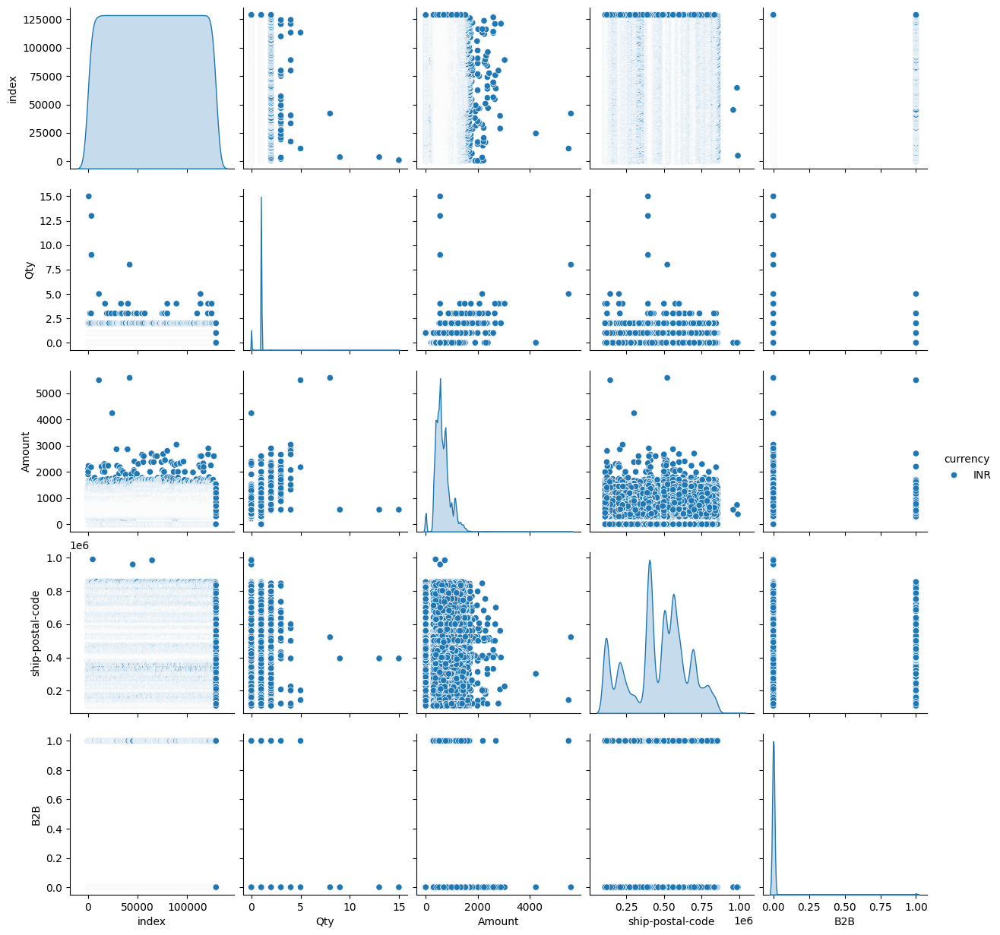

In [ ]:
sns.pairplot(data, hue = 'currency')
plt.show()

In [ ]:
for i in data.select_dtypes(include = "number").columns:
    fig = px.histogram(data, x = i)
    fig.show()

In [ ]:
for i in data.select_dtypes(include = "number").columns:
    fig = px.box(data, x = i)
    fig.show()

In [ ]:
sales_per_day = data.groupby('Date')['Amount'].sum().reset_index()
fig = px.line(sales_per_day, x = 'Date', y = 'Amount',
              title = 'Sales Amount Over Time')
fig.show()

In [ ]:
fig = px.pie(data, names = 'Sales Channel',
             title = 'Sales Channel Distribution', hole=0.4)
fig.show()

In [ ]:
fig = px.histogram(data, x = 'Qty',
                   title = 'Quantity Distribution')
fig.show()

In [ ]:
category_sales = data.groupby('Category')['Amount'].sum().reset_index()

fig = px.bar(category_sales, x = 'Category', y = 'Amount',
             title = 'Category-wise Sales', text='Amount')
fig.show()

In [ ]:
fig = px.box(data, x = 'Fulfilment', y = 'Amount',
             title = 'Sales Amount by Fulfillment Type')
fig.show()

In [ ]:
fig = px.scatter(data, x = 'Qty', y = 'Amount',
                 title = 'Quantity vs. Amount')
fig.show()

In [ ]:
fig = px.box(data, x = 'ship-service-level', y = 'Amount',
             title = 'Sales Amount by Shipping Service Level')
fig.show()

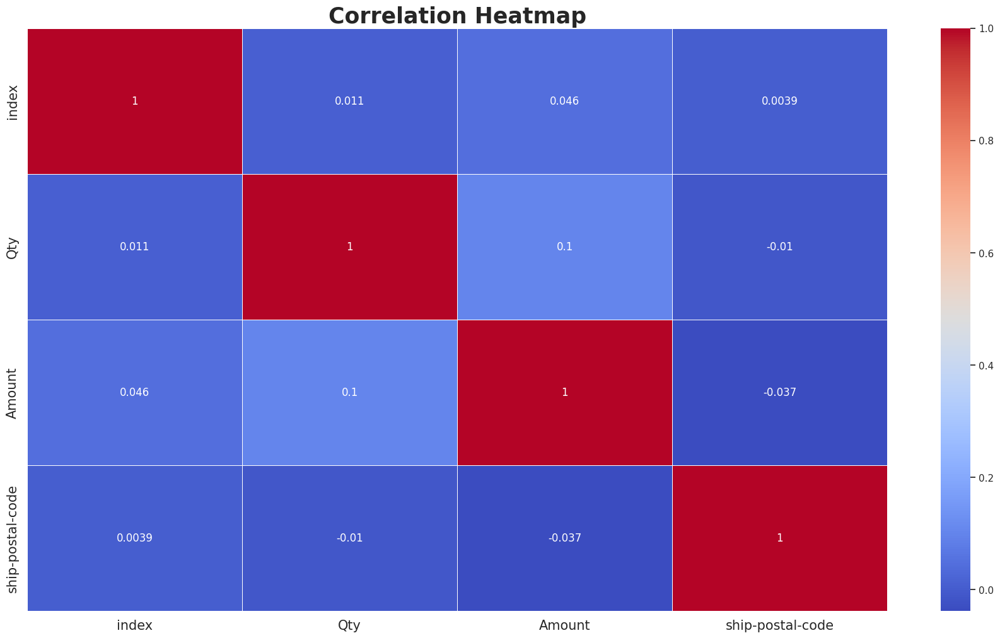

In [ ]:
sns.set(rc = {"figure.figsize" : (22, 12)})
s = data.select_dtypes(include = "number").corr()
sns.heatmap(s, annot = True, cmap = "coolwarm", linewidth = 0.5)
plt.title("Correlation Heatmap", fontsize = 25, fontweight = "bold")
plt.xticks(fontsize = 15)
plt.yticks(fontsize = 15)
plt.show()

Summary Stats:
count    128976.000000
mean          5.512212
std           2.874209
min           1.000000
25%           3.000000
50%           6.000000
75%           8.000000
max          10.000000
Name: Customer Satisfaction Score, dtype: float64

Score Frequency:
Customer Satisfaction Score
1     12903
2     12790
3     12725
4     12909
5     12931
6     12897
7     13058
8     12778
9     12868
10    13117
Name: count, dtype: int64


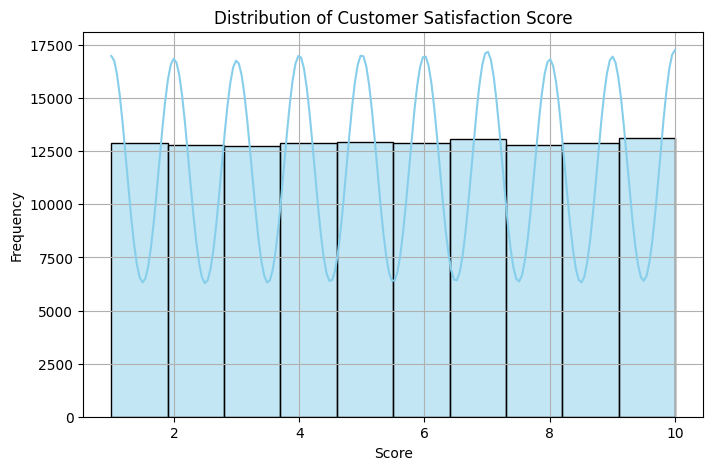

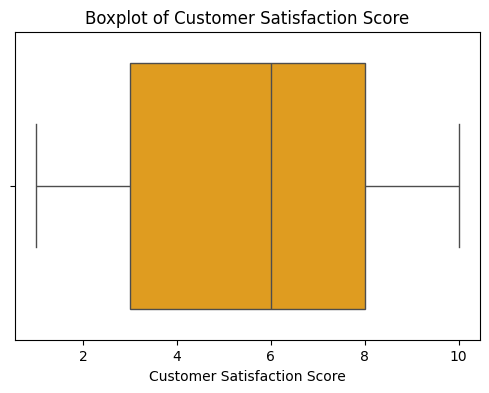

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
df = pd.read_csv("/content/Amazon_Sale_Report_With_Satisfaction.csv")
print("Summary Stats:")
print(df["Customer Satisfaction Score"].describe())

# 2. Frequency of each score
print("\nScore Frequency:")
print(df["Customer Satisfaction Score"].value_counts().sort_index())

# 3. Histogram
plt.figure(figsize=(8, 5))
sns.histplot(df["Customer Satisfaction Score"], bins=10, kde=True, color='skyblue')
plt.title("Distribution of Customer Satisfaction Score")
plt.xlabel("Score")
plt.ylabel("Frequency")
plt.grid(True)
plt.show()

# 4. Boxplot for outlier check
plt.figure(figsize=(6, 4))
sns.boxplot(x=df["Customer Satisfaction Score"], color='orange')
plt.title("Boxplot of Customer Satisfaction Score")
plt.show()

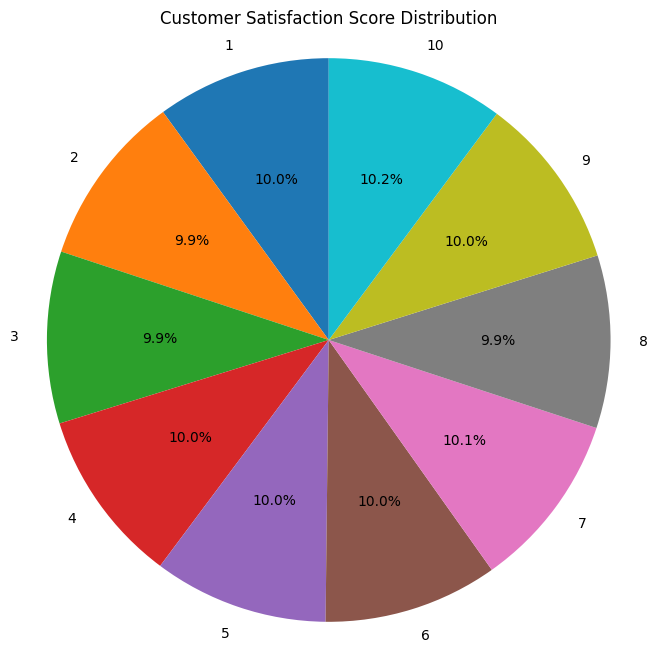

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the CSV file
df = pd.read_csv("/content/Amazon_Sale_Report_With_Satisfaction.csv")

# Clean column names by stripping whitespace
df.columns = df.columns.str.strip()

# Use the correct column name
score_counts = df['Customer Satisfaction Score'].value_counts().sort_index()

# Plotting pie chart
plt.figure(figsize=(8, 8))
plt.pie(score_counts, labels=score_counts.index, autopct='%1.1f%%', startangle=90)
plt.title('Customer Satisfaction Score Distribution')
plt.axis('equal')
plt.show()